# Combustion Chemistry in Isobaric Reactor: Analyzing the Principal Components of the $R_{H}$ Data Matrix

In [1]:
### Importing Libraries

import sys
print(sys.version)
import os
import time


### Defining WORKSPACE_PATH

# WORKSPACE_PATH = os.environ['WORKSPACE_PATH']
WORKSPACE_PATH = os.path.join(os.getcwd(), '../../../../../')
ROMNet_fld     = os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/')


### Importing External Libraries

import numpy                             as np
import pandas                            as pd
pd.options.mode.chained_assignment = None  # default='warn'


### Importing Matplotlib and Its Style

import matplotlib.pyplot                 as plt

#plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/presentation.mplstyle'))
#plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/zoomed.mplstyle'))
plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/paper_1column.mplstyle'))
#plt.style.use(os.path.join(WORKSPACE_PATH, 'ROMNet/romnet/extra/postprocessing/paper_2columns.mplstyle'))


# from scipy.integrate import solve_ivp
# import pyDOE    
from PCAfold         import PCA          as PCAA

# from IPython.core.display import display, HTML
# display(HTML("<style>.container { width:80% !important; }</style>"))

3.8.11 (default, Jun 29 2021, 03:17:05) 
[Clang 12.0.0 (clang-1200.0.32.29)]


Missing colon in file PosixPath('/Users/sventur/.matplotlib/stylelib/paper_2columns.mplstyle'), line 1 ('f#### MATPLOTLIBRC FORMAT')


## Defining Input Variables

In [2]:
DataDir            = os.path.join(WORKSPACE_PATH, 'ROMNet/Data/0DReact_Isobaric_500Cases_atol/')
FigDir             = os.path.join(WORKSPACE_PATH, '../Desktop/Paper_Figures_DeepONet/')

NVarsRed           = 10

tStratch           = 1.
SOLVER             = 'BDF'

valid_perc         = 20.

FixedMinVal        = 1.e-12

PCA_NAME           = '1'
iPC                = 0

if (PCA_NAME == 'All'):
    n_modesFinal   = 64
    PCAType        = 'All'
else:
    n_modesFinal   = 64
    PCAType        = 'OneByOne'
    
    
ColorVec           = ['#190707', '#dd3232', '#0065a9', '#348a00','#985396','#f68b69']

try:
    os.makedirs(DataDir)
except OSError as e:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType))
except:
    pass

In [3]:
FileName     = DataDir + '/Orig/train/ext/SimIdxs.csv'
Data         = pd.read_csv(FileName, header=0)
SimIdxs      = Data.to_numpy(int)


FileName     = DataDir + '/Orig/train/ext/ICs.csv'
Data         = pd.read_csv(FileName)
ICVecs       = Data.to_numpy()
n_ics         = len(ICVecs)

In [4]:
if (PCA_NAME == 'All'):
    
    Cols   = []
    NewFlg = True
    for iC in range(100):

        Nts                  = SimIdxs[iC,1]-SimIdxs[iC,0]
        NtsNow               = Nts



        FileName             = DataDir+'/'+str(NVarsRed)+'PC/train/ext/PC.csv.'+str(iC+1)
        Data                 = pd.read_csv(FileName, header=0)
        DataTemp             = Data[['PC_'+str(iPC+1) for iPC in range(NVarsRed)]]


        Flg = True
        for iPC in range(NVarsRed):
            if (np.abs( (DataTemp['PC_'+str(iPC+1)][0] - DataTemp['PC_'+str(iPC+1)][len(Data)-1])/DataTemp['PC_'+str(iPC+1)][0] ) < 1.e-4): 
                Flg = False
                break
        
        if Flg:
            DataICTemp  = Data[['PC_'+str(iPC+1) for iPC in range(NVarsRed)]].iloc[0]
            
            if (NewFlg):
                DataInput        = DataTemp
                DataIC           = DataICTemp
                NewFlg           = False
            else:
                DataInput        = pd.concat([DataInput, DataTemp], axis=1)
                DataIC           = pd.concat([DataIC, DataICTemp], axis=1)
            Cols += [str(iC+1)+'_PC_'+str(iPC+1) for iPC in range(NVarsRed)]
            
        else:
            print('iC ', iC)

    tVec              = Data['t']
    DataInput.columns = Cols
    
    yMat              = DataInput.to_numpy()
    
else:
    
    Cols   = []
    NewFlg = True
    for iC in range(n_ics):

        Nts                  = SimIdxs[iC,1]-SimIdxs[iC,0]
        NtsNow               = Nts



        FileName             = DataDir+'/'+str(NVarsRed)+'PC/train/ext/PC.csv.'+str(iC+1)
        Data                 = pd.read_csv(FileName, header=0)
        DataTemp             = Data['PC_'+str(iPC+1)]

        if (np.abs( (DataTemp[0] - DataTemp[len(Data)-1])/DataTemp[0] ) > 1.e-4):
            DataICTemp  = Data[['PC_'+str(iPC+1) for iPC in range(NVarsRed)]].iloc[0]
            
            if (NewFlg):
                DataInput        = DataTemp
                DataIC           = DataICTemp
                NewFlg           = False
            else:
                DataInput        = pd.concat([DataInput, DataTemp], axis=1)
                DataIC           = pd.concat([DataIC, DataICTemp], axis=1)
            Cols.append(str(iC+1))

    tVec              = Data['t']
    DataInput.columns = Cols

    yMat              = DataInput.to_numpy()
    
DataIC            = DataIC.T.reset_index(drop=True, inplace=False)

In [5]:
ICs = DataIC.to_numpy()

In [6]:
DataInput

,1,2,3,4,5,6,7,8,9,10,...,491,492,493,494,495,496,497,498,499,500
0,-19.650791,-39.976706,-43.310635,-31.276561,-42.253496,-11.194213,-14.446858,-38.431487,-39.895204,-9.894142,...,-33.797985,-45.179624,-29.976314,-8.836346,-9.974505,-23.959412,-39.813666,-19.407012,-30.138349,-25.098045
1,-19.650893,-39.976706,-43.310635,-31.276565,-42.253496,-11.194668,-14.447161,-38.431487,-39.895204,-9.894818,...,-33.797987,-45.179624,-29.976321,-8.837009,-9.974964,-23.959449,-39.813666,-19.407117,-30.138355,-25.098073
2,-19.650897,-39.976706,-43.310635,-31.276565,-42.253496,-11.194684,-14.447171,-38.431487,-39.895204,-9.894840,...,-33.797987,-45.179624,-29.976321,-8.837031,-9.974980,-23.959451,-39.813666,-19.407120,-30.138355,-25.098074
3,-19.650900,-39.976706,-43.310635,-31.276566,-42.253496,-11.194699,-14.447181,-38.431487,-39.895204,-9.894863,...,-33.797987,-45.179624,-29.976321,-8.837054,-9.974995,-23.959452,-39.813666,-19.407124,-30.138355,-25.098075
4,-19.650904,-39.976706,-43.310635,-31.276566,-42.253496,-11.194715,-14.447192,-38.431487,-39.895204,-9.894887,...,-33.797988,-45.179624,-29.976322,-8.837078,-9.975012,-23.959453,-39.813666,-19.407128,-30.138355,-25.098076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,18.514739,12.979761,2.297601,24.981497,6.367950,30.288662,26.433598,22.459532,17.368434,23.553150,...,8.511358,17.894048,16.340572,30.537735,26.742045,24.783402,22.001387,16.918954,25.509861,18.378796
496,18.514739,12.979761,2.297601,24.981497,6.367950,30.288662,26.433598,22.459532,17.368434,23.553150,...,8.511358,17.894048,16.340572,30.537735,26.742045,24.783402,22.001387,16.918954,25.509861,18.378796
497,18.514739,12.979761,2.297601,24.981497,6.367950,30.288662,26.433598,22.459532,17.368434,23.553150,...,8.511358,17.894048,16.340572,30.537735,26.742045,24.783402,22.001387,16.918954,25.509861,18.378796
498,18.514739,12.979761,2.297601,24.981497,6.367950,30.288662,26.433598,22.459532,17.368434,23.553150,...,8.511358,17.894048,16.340572,30.537735,26.742045,24.783402,22.001387,16.918954,25.509861,18.378796


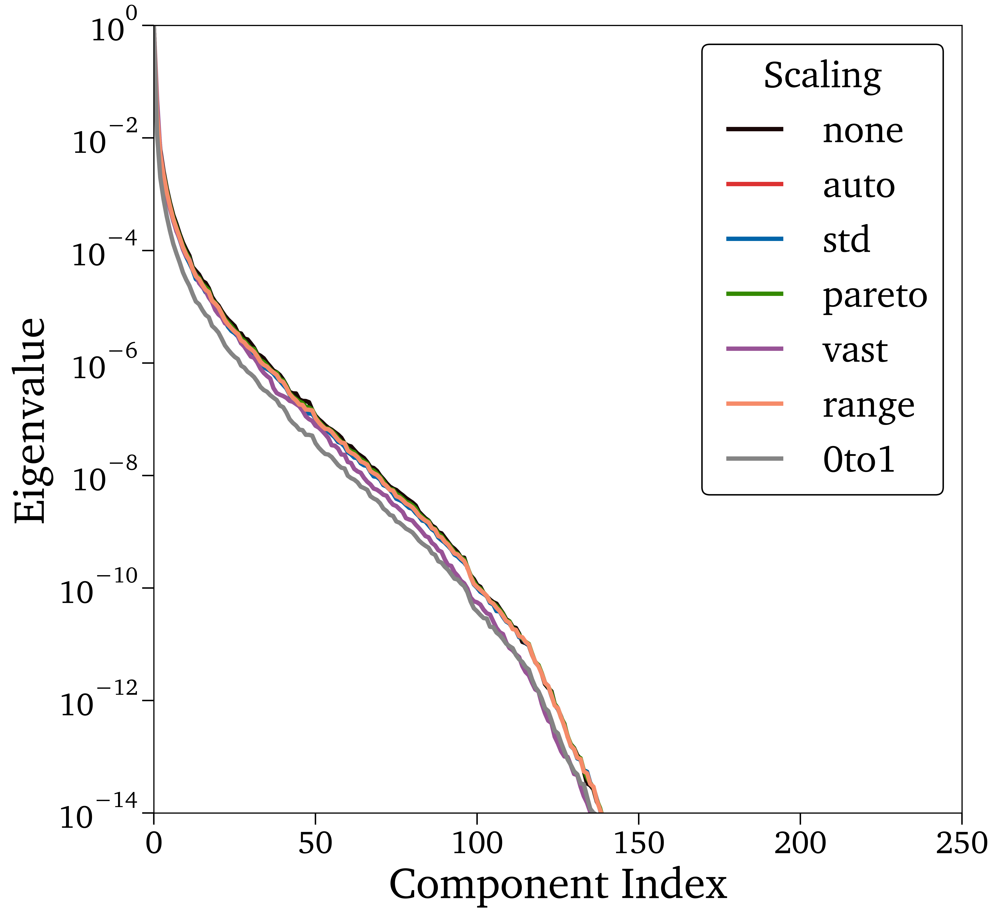

In [7]:
n_modes      = 128
ScalingVec = ['none', 'auto', 'std', 'pareto', 'vast', 'range', '0to1']
#'none', '', 'auto', 'std', 'pareto', 'vast', 'range', '0to1', '-1to1', 'level', 'max', 'poisson', 'vast_2', 'vast_3', 'vast_4'

plt.figure()
for j, Scaling in enumerate(ScalingVec):

    pca        = PCAA(yMat, scaling=Scaling, n_components=int(n_modes))
    C          = pca.X_center
    D          = pca.X_scale
    A          = pca.A[:,0:n_modes].T
    L          = pca.L
    AT         = A.T

    plt.plot(L, label=Scaling)
    
plt.xlim([0., 250])
plt.ylim([1.e-14, 1.e0])
plt.yscale('log')
plt.xlabel('Component Index')
plt.ylabel('Eigenvalue')
plt.legend(title='Scaling')

if (FigDir):
    plt.savefig(FigDir+'/0DReactor_Eigenvalues_OneByOne_PC'+str(iPC+1)+'.eps', format='eps', bbox_inches='tight')

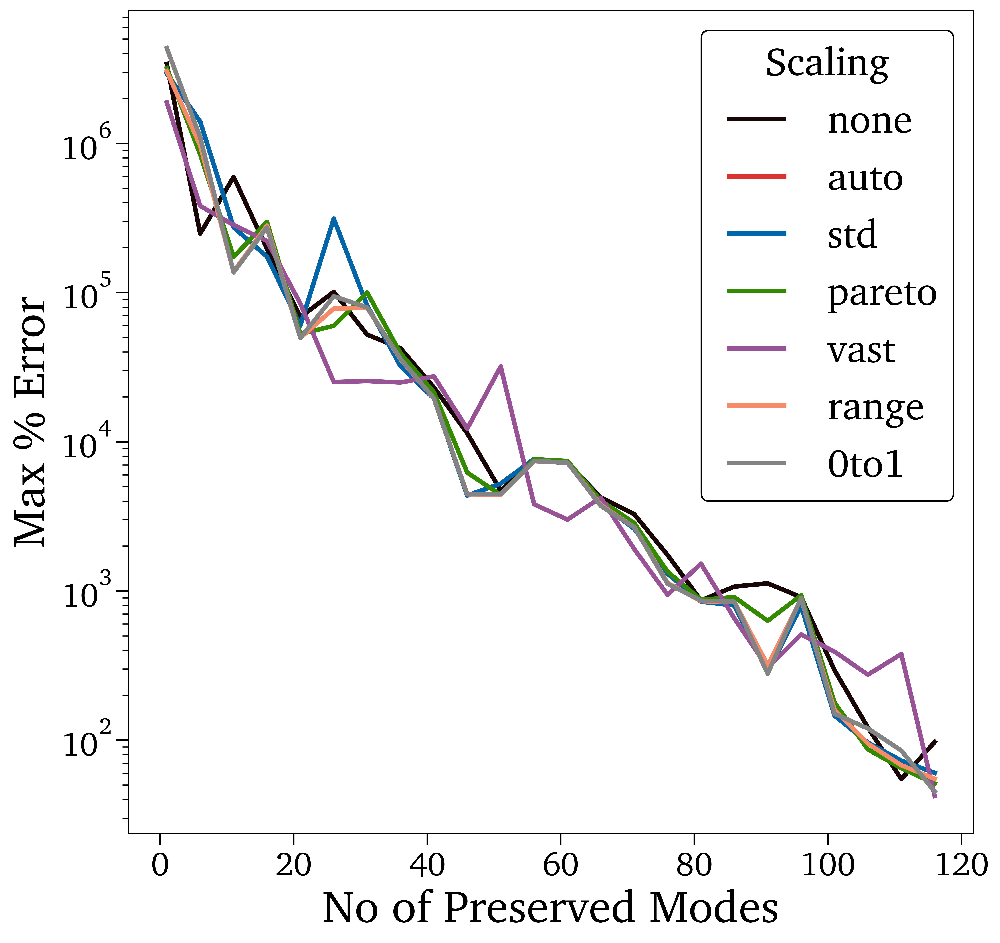

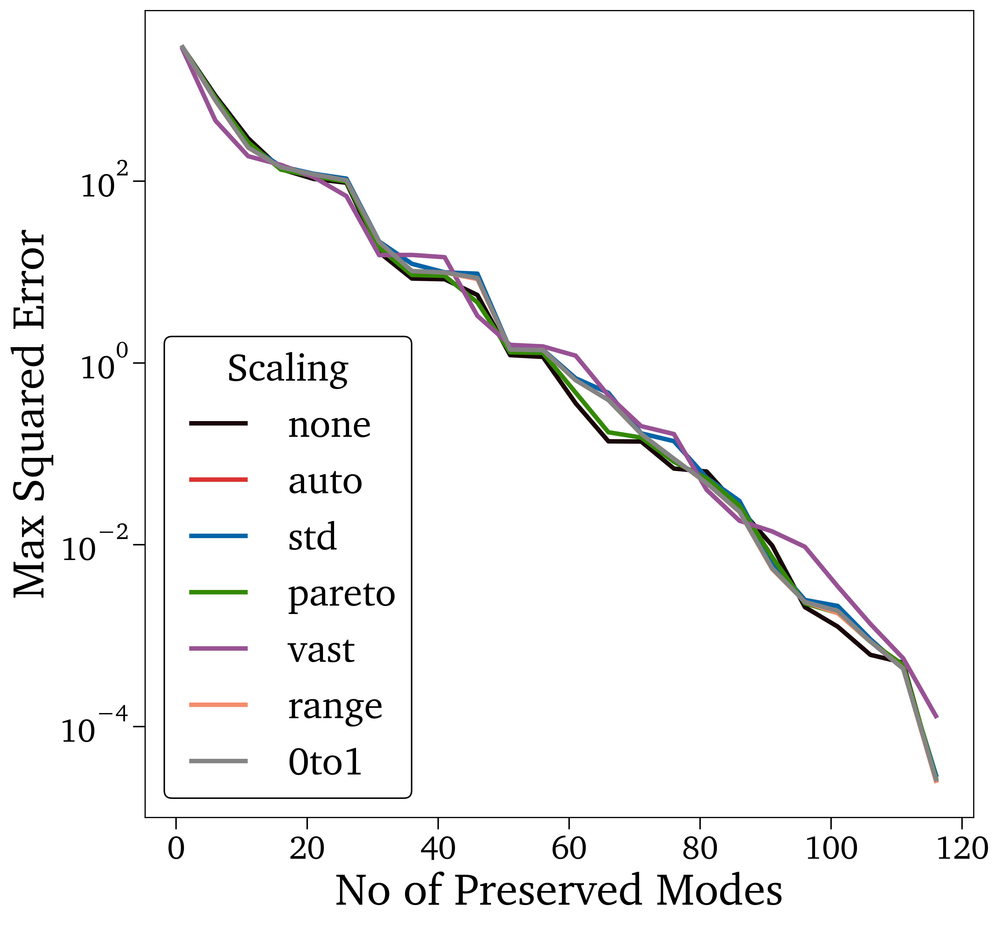

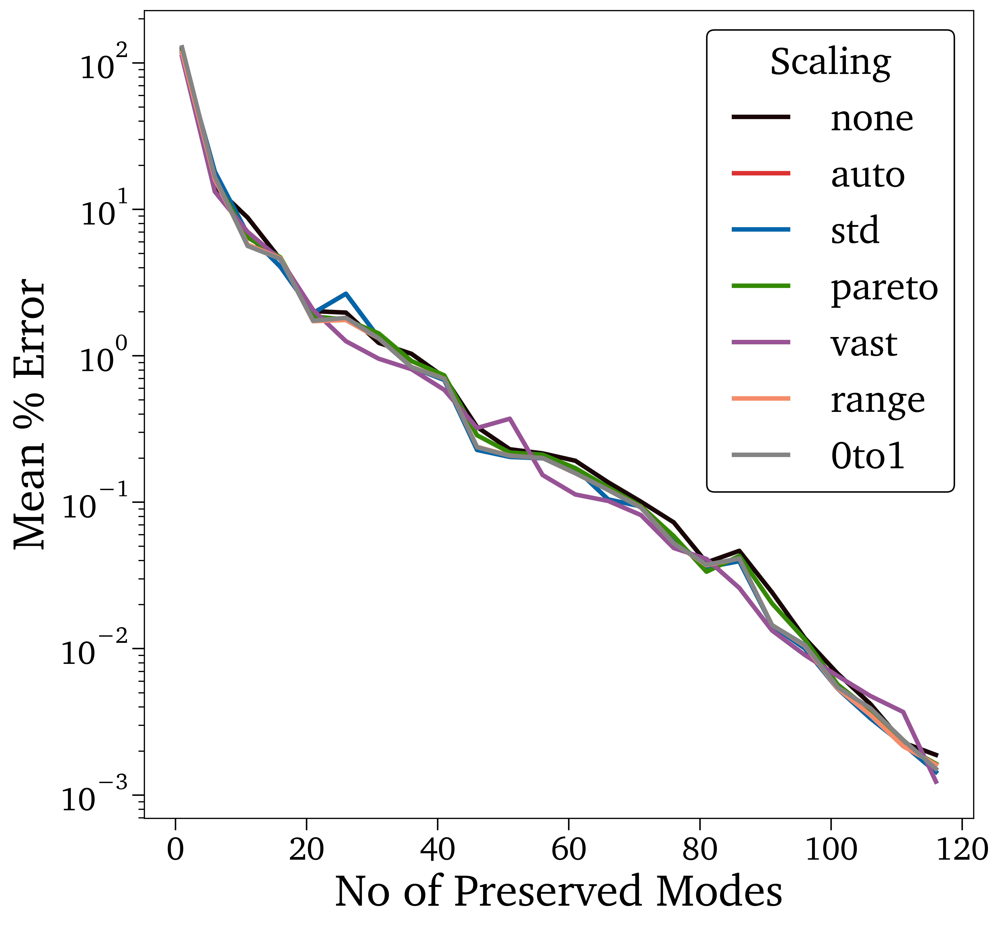

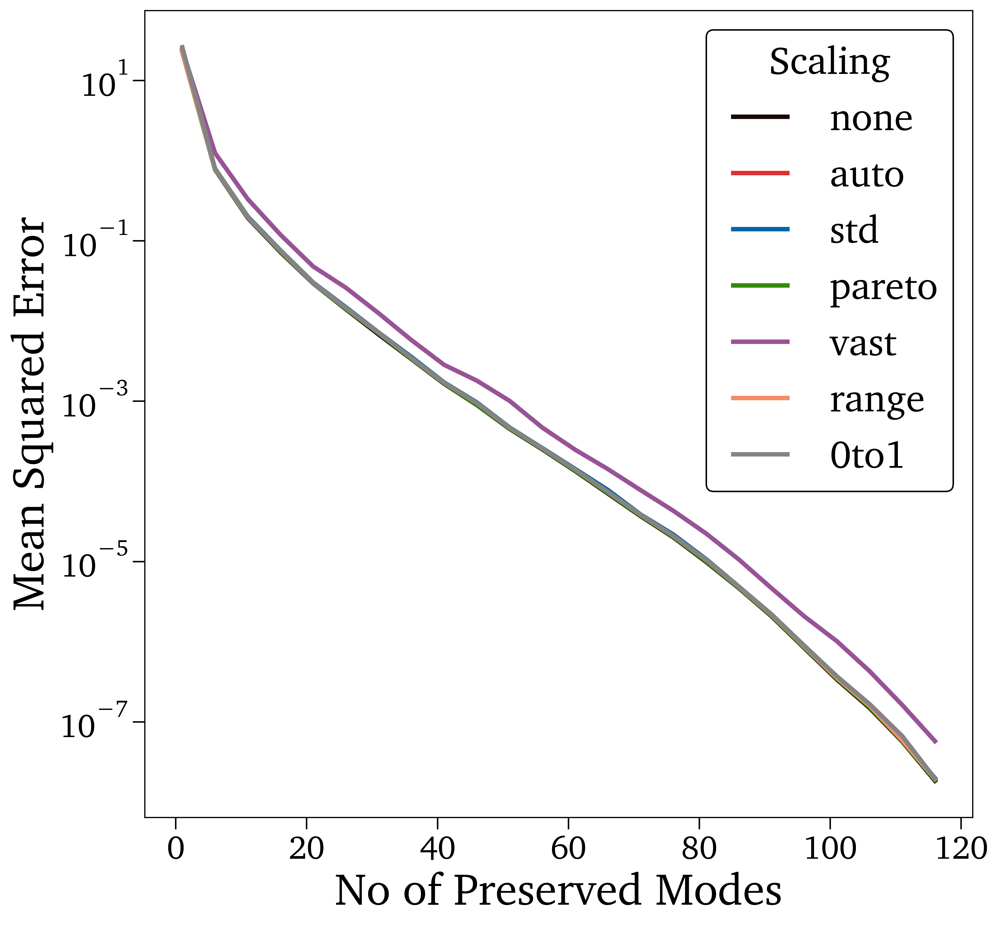

In [8]:
n_modesVec   = np.arange(1,120,5)
ScalingVec = ['none', 'auto', 'std', 'pareto', 'vast', 'range', '0to1']
#'none', '', 'auto', 'std', 'pareto', 'vast', 'range', '0to1', '-1to1', 'level', 'max', 'poisson', 'vast_2', 'vast_3', 'vast_4'

MaxPerc    = np.zeros((len(n_modesVec), len(ScalingVec)))
MaxSE      = np.zeros((len(n_modesVec), len(ScalingVec)))
MeanPerc   = np.zeros((len(n_modesVec), len(ScalingVec)))
MSE        = np.zeros((len(n_modesVec), len(ScalingVec)))
for i, n_modes in enumerate(n_modesVec):
    #print('n_modes = ', n_modes)
    
    for j, Scaling in enumerate(ScalingVec):

        pca        = PCAA(yMat, scaling=Scaling, n_components=int(n_modes), nocenter=False)
        C          = pca.X_center
        D          = pca.X_scale
        A          = pca.A[:,0:n_modes].T
        L          = pca.L
        AT         = A.T

        yMat_pca   = ((yMat - C)/D).dot(AT)
        yMat_      = (yMat_pca.dot(A))*D + C
        
        MaxPerc[i,j]    = np.max(abs((yMat - yMat_)/yMat)*100)
        MaxSE[i,j]      = np.max((yMat - yMat_)**2)
        MeanPerc[i,j]   = np.mean(abs((yMat - yMat_)/yMat)*100)
        MSE[i,j]        = np.mean((yMat - yMat_)**2)

plt.figure()
plt.plot(n_modesVec, MaxPerc, label=ScalingVec)
plt.xlabel('No of Preserved Modes')
plt.ylabel('Max % Error')
plt.legend(title='Scaling')
plt.yscale('log')

plt.figure()
plt.plot(n_modesVec, MaxSE, label=ScalingVec)
plt.xlabel('No of Preserved Modes')
plt.ylabel('Max Squared Error')
plt.legend(title='Scaling')
plt.yscale('log')

plt.figure()
plt.plot(n_modesVec, MeanPerc, label=ScalingVec)
plt.xlabel('No of Preserved Modes')
plt.ylabel('Mean % Error')
plt.legend(title='Scaling')
plt.yscale('log')

plt.figure()
plt.plot(n_modesVec, MSE, label=ScalingVec)
plt.xlabel('No of Preserved Modes')
plt.ylabel('Mean Squared Error')
plt.legend(title='Scaling')
plt.yscale('log')

if (FigDir):
    plt.savefig(FigDir+'/0DReact_MSE_OneByOne_PC'+str(iPC+1)+'.eps', format='eps', bbox_inches='tight')

In [9]:
### EXPERIMENTING: ROBUST PCA PREPROCESSING

# from __future__ import division, print_function

# import numpy as np

# try:
#     from pylab import plt
# except ImportError:
#     print('Unable to import pylab. R_pca.plot_fit() will not work.')

# try:
#     # Python 2: 'xrange' is the iterative version
#     range = xrange
# except NameError:
#     # Python 3: 'range' is iterative - no need for 'xrange'
#     pass


# class R_pca:

#     def __init__(self, D, mu=None, lmbda=None):
#         self.D = D
#         self.S = np.zeros(self.D.shape)
#         self.Y = np.zeros(self.D.shape)

#         if mu:
#             self.mu = mu
#         else:
#             self.mu = np.prod(self.D.shape) / (4 * np.linalg.norm(self.D, ord=1))

#         self.mu_inv = 1 / self.mu

#         if lmbda:
#             self.lmbda = lmbda
#         else:
#             self.lmbda = 1 / np.sqrt(np.max(self.D.shape))

#     @staticmethod
#     def frobenius_norm(M):
#         return np.linalg.norm(M, ord='fro')

#     @staticmethod
#     def shrink(M, tau):
#         return np.sign(M) * np.maximum((np.abs(M) - tau), np.zeros(M.shape))

#     def PCA_threshold(self, M, tau):
#         U, S, V = np.linalg.PCA(M, full_matrices=False)
#         return np.dot(U, np.dot(np.diag(self.shrink(S, tau)), V))

#     def fit(self, tol=None, max_iter=1000, iter_print=100):
#         iter = 0
#         err = np.Inf
#         Sk = self.S
#         Yk = self.Y
#         Lk = np.zeros(self.D.shape)

#         if tol:
#             _tol = tol
#         else:
#             _tol = 1E-7 * self.frobenius_norm(self.D)

#         #this loop implements the principal component pursuit (PCP) algorithm
#         #located in the table on page 29 of https://arxiv.org/pdf/0912.3599.pdf
#         while (err > _tol) and iter < max_iter:
#             Lk = self.PCA_threshold(
#                 self.D - Sk + self.mu_inv * Yk, self.mu_inv)                            #this line implements step 3
#             Sk = self.shrink(
#                 self.D - Lk + (self.mu_inv * Yk), self.mu_inv * self.lmbda)             #this line implements step 4
#             Yk = Yk + self.mu * (self.D - Lk - Sk)                                      #this line implements step 5
#             err = self.frobenius_norm(self.D - Lk - Sk)
#             iter += 1
#             if (iter % iter_print) == 0 or iter == 1 or iter > max_iter or err <= _tol:
#                 print('iteration: {0}, error: {1}'.format(iter, err))

#         self.L = Lk
#         self.S = Sk
#         return Lk, Sk

#     def plot_fit(self, size=None, tol=0.1, axis_on=True):

#         n, d = self.D.shape

#         if size:
#             nrows, ncols = size
#         else:
#             sq = np.ceil(np.sqrt(n))
#             nrows = int(sq)
#             ncols = int(sq)

#         ymin = np.nanmin(self.D)
#         ymax = np.nanmax(self.D)
#         print('ymin: {0}, ymax: {1}'.format(ymin, ymax))

#         numplots = np.min([n, nrows * ncols])
#         plt.figure()

#         for n in range(numplots):
#             plt.subplot(nrows, ncols, n + 1)
#             plt.ylim((ymin - tol, ymax + tol))
#             plt.plot(self.L[n, :] + self.S[n, :], 'r')
#             plt.plot(self.L[n, :], 'b')
#             if not axis_on:
#                 plt.axis('off')

In [10]:
# LL, SS = R_pca(yMat).fit(max_iter=1500)#tol=5.e-5)

In [11]:
# iVar = 0

# fig = plt.figure(figsize=(12,8))
# plt.plot(yMat[:,iVar])
# plt.plot(LL[:,iVar])


# fig = plt.figure(figsize=(12,8))
# plt.plot(SS[:,iVar])

In [12]:
n_modesFinal = 64

pca        = PCAA(yMat, scaling='pareto', n_components=n_modesFinal, nocenter=False)
C          = pca.X_center
D          = pca.X_scale
A          = pca.A[:,0:n_modesFinal].T
L          = pca.L
AT         = A.T
print('[PCA] Shape of A        = ', A.shape)
print('[PCA] ')

[PCA] Shape of A        =  (64, 500)
[PCA] 


In [13]:
#yMat_pca    = pca.transform(yMat, nocenter=False)
yMat_pca   = ((yMat - C)/D).dot(AT)

yMat_      = (yMat_pca.dot(A))*D + C
print('[PCA] Shape of yMat_pca = ', yMat_pca.shape)
print('[PCA]  Max % Error = ', np.max(abs((yMat - yMat_)/yMat)*100))
print('[PCA]  Max      SE = ', np.max((yMat - yMat_)**2))
print('[PCA] Mean % Error = ', np.mean(abs((yMat - yMat_)/yMat)*100))
print('[PCA]          MSE = ', np.mean((yMat - yMat_)**2))

[PCA] Shape of yMat_pca =  (500, 64)
[PCA]  Max % Error =  6580.057476954737
[PCA]  Max      SE =  0.366405503753833
[PCA] Mean % Error =  0.17397232108549568
[PCA]          MSE =  9.436734006892692e-05


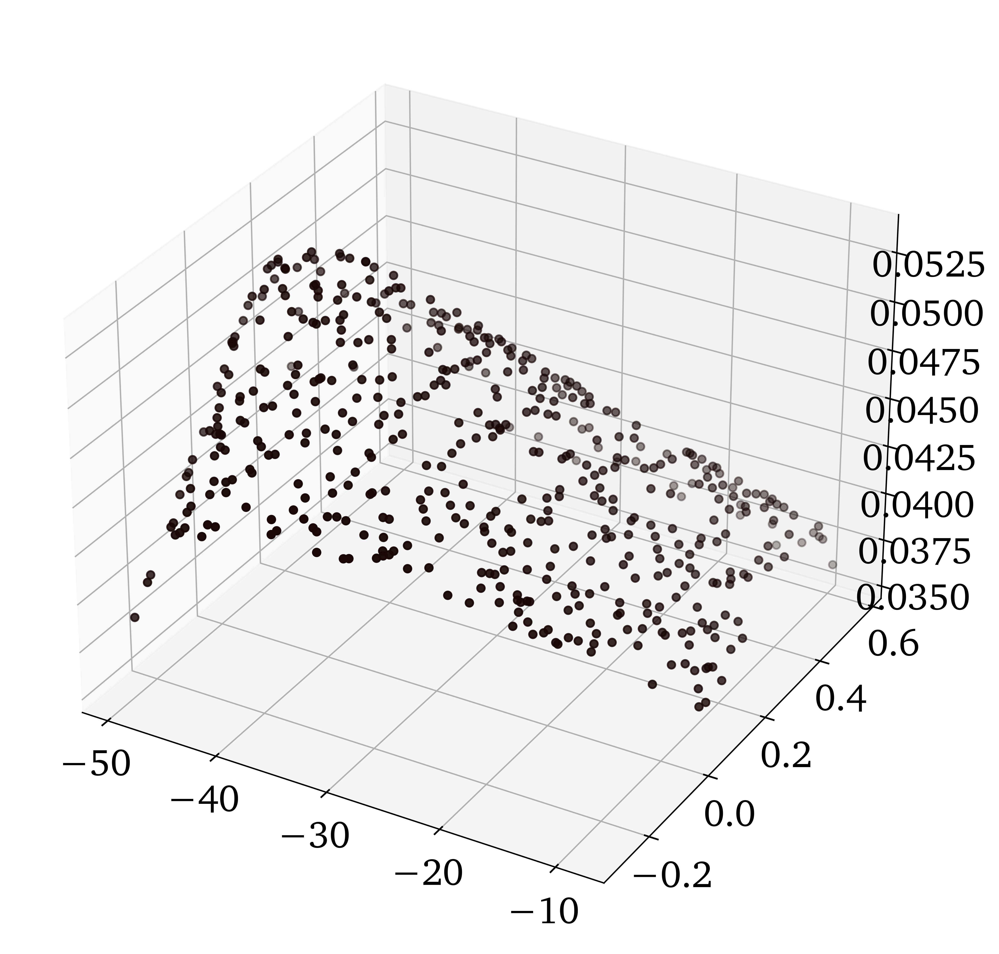

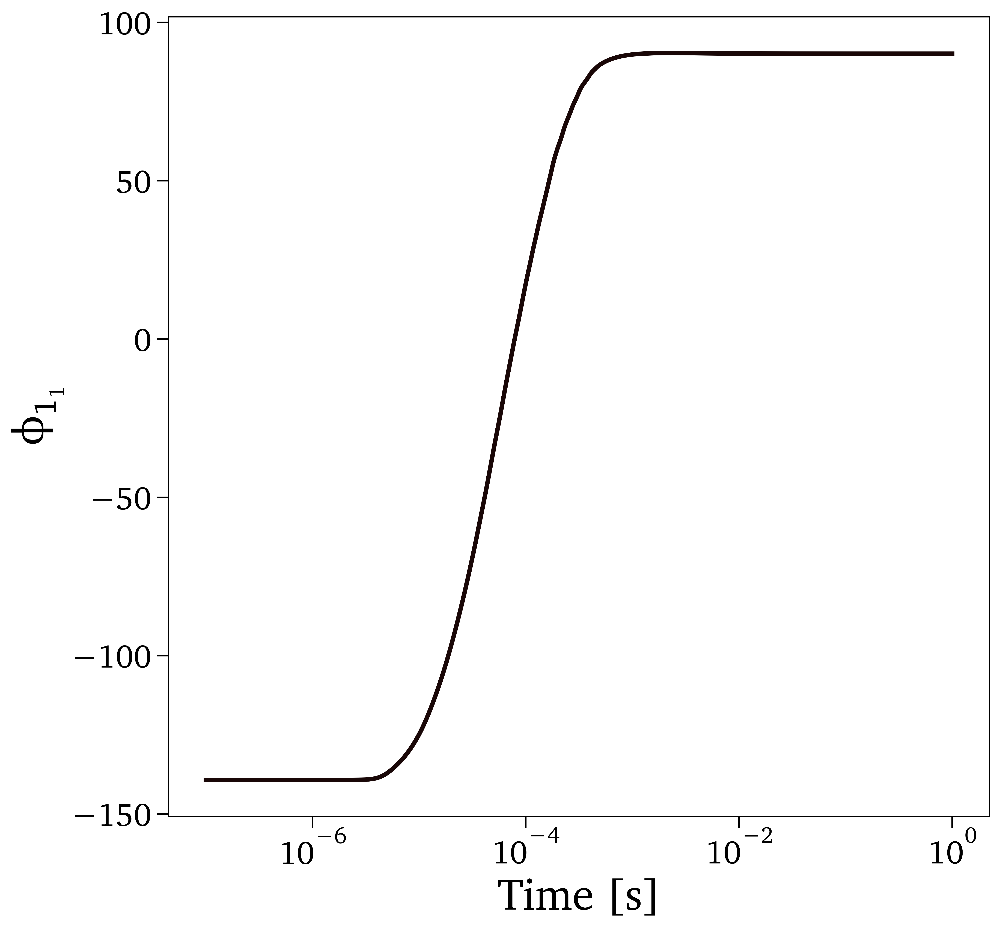

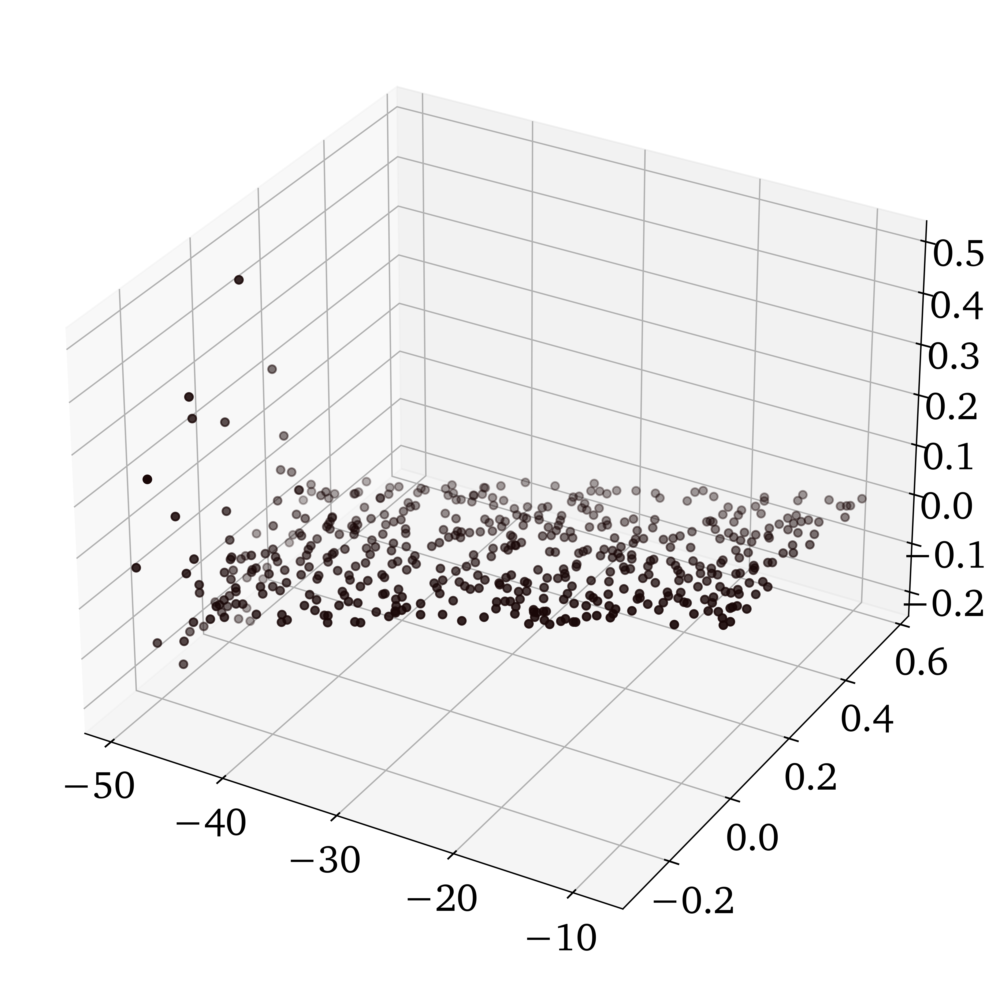

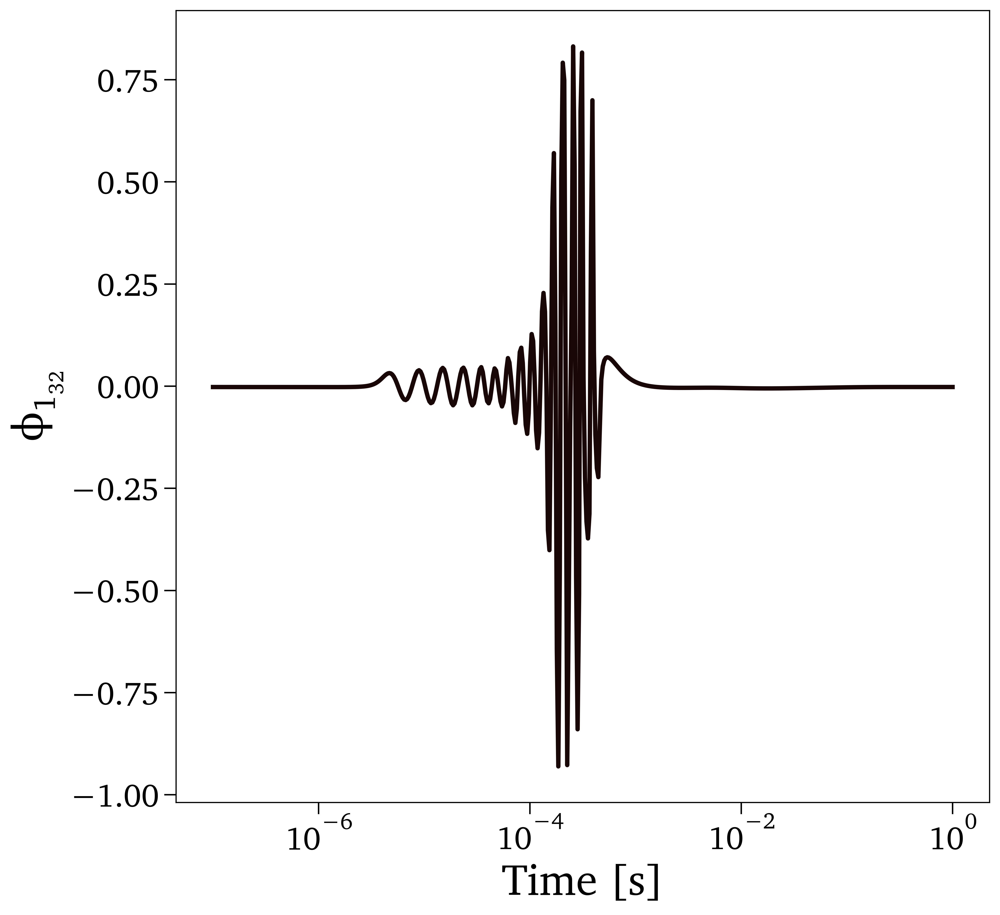

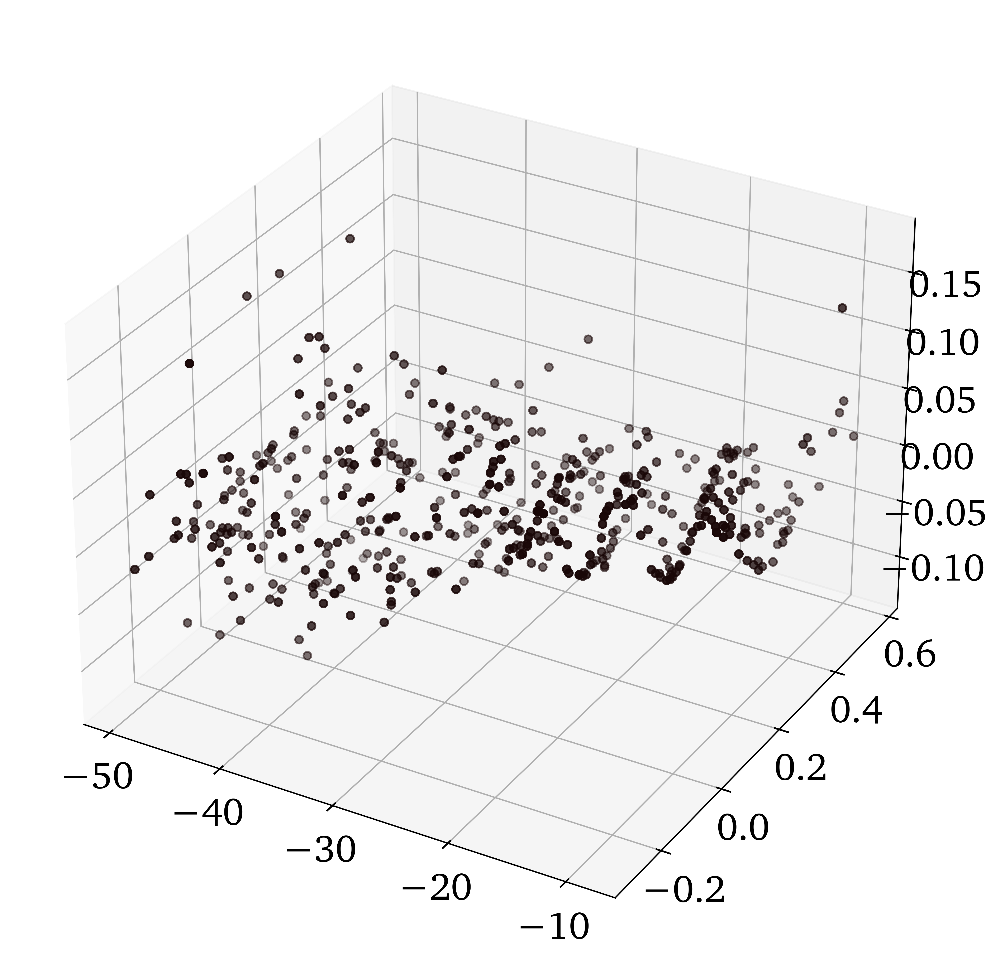

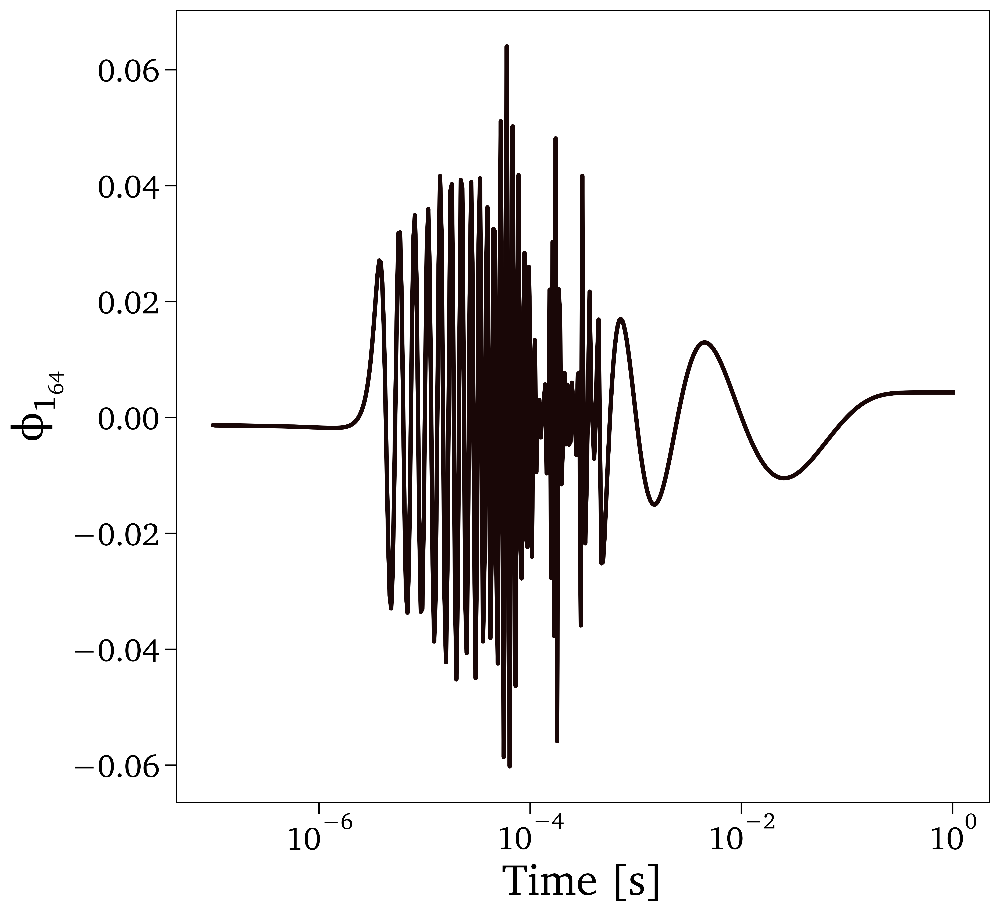

In [14]:
iVarVec = [0,31,63]

for iVar in iVarVec:
    
    Eta_1   = DataIC.to_numpy()[:,0]
    Eta_2   = DataIC.to_numpy()[:,1]
    Alpha_1 = A[iVar,:]

    fig = plt.figure()
    ax  = fig.add_subplot(projection='3d')
    ax.scatter(Eta_1, Eta_2, Alpha_1)

    plt.figure()
    plt.plot(tVec, yMat_pca[:,iVar], '-')
    plt.xscale('log')
    plt.xlabel('Time [s]')
    plt.ylabel('$\phi_{'+str(iPC+1)+'_{'+str(iVar+1)+'}}$')
    #plt.xlim([1.e-6,1.e-4])
    
    if (FigDir):
        plt.savefig(FigDir+'/0DReact_PCA_PC'+str(iPC+1)+'_phi'+str(iVar+1)+'.eps', format='eps', bbox_inches='tight')

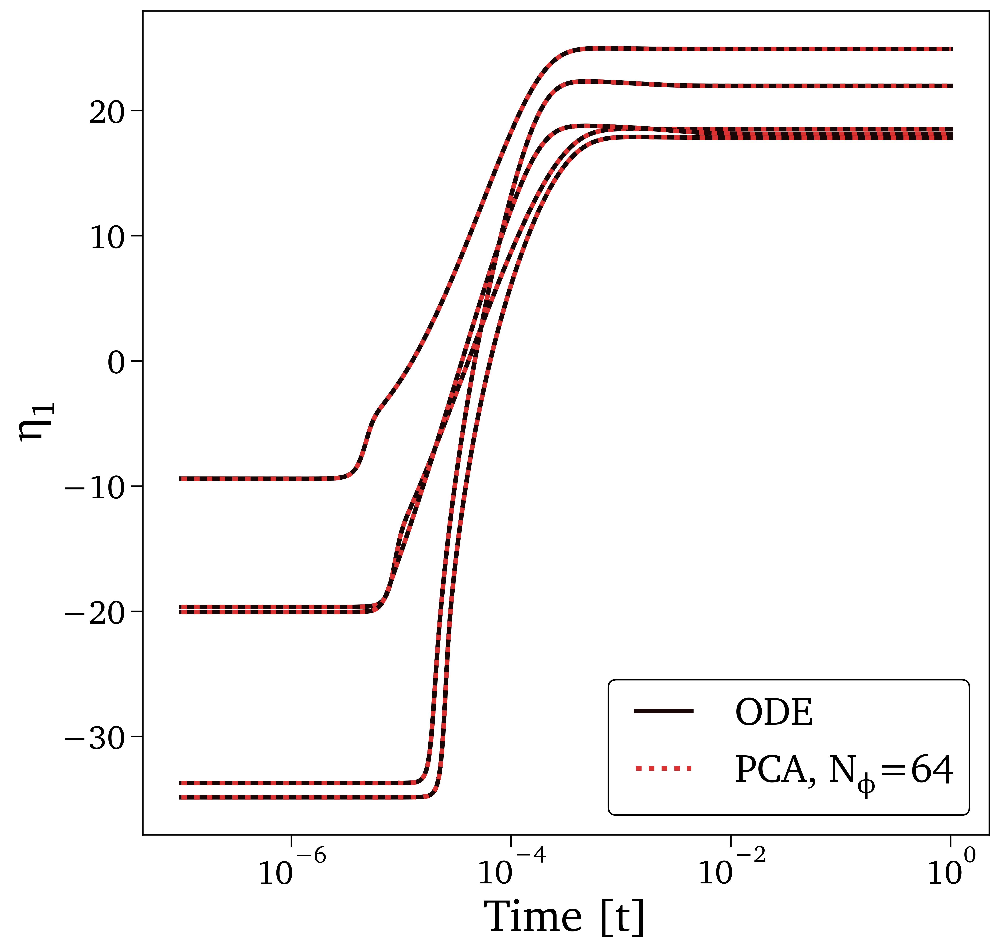

In [15]:
plt.figure()
jCase = 0
for iCase in range(0,500,100):
    if (jCase == 0):
        Label1 = 'ODE'
        Label2 = 'PCA, $N_{\phi}$='+str(n_modesFinal)
    else:
        Label1 = ''
        Label2 = ''

    plt.plot(tVec, yMat[:,iCase],  '-', c=ColorVec[0], label=Label1)
    plt.plot(tVec, yMat_[:,iCase], ':', c=ColorVec[1], label=Label2)
    
    jCase += 1 
    
plt.legend()
plt.xlabel('Time [t]')
plt.ylabel('$\eta_{'+str(iPC+1)+'}$')
plt.xscale('log')

if (FigDir):
    plt.savefig(FigDir+'/0DReact_PCA_PC'+str(iPC+1)+'_Reconstructed_'+str(n_modesFinal)+'.eps', format='eps', bbox_inches='tight')

In [16]:
# #n_modesFinal = 5

# pca        = PCAA(LL, scaling='pareto', n_components=n_modesFinal, nocenter=False)
# C          = pca.X_center
# D          = pca.X_scale
# A          = pca.A[:,0:n_modesFinal].T
# L          = pca.L
# AT         = A.T
# print('[PCA] Shape of A        = ', A.shape)
# print('[PCA] ')

In [17]:
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/ROM/')
except:
    pass

FileName    = DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/ROM/A.csv'
np.savetxt(FileName, A, delimiter=',')

FileName    = DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/ROM/C.csv'
np.savetxt(FileName, C, delimiter=',')

FileName    = DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/ROM/D.csv'
np.savetxt(FileName, D, delimiter=',')

In [18]:
# #yMat_pca    = pca.transform(yMat, nocenter=False)
# yMat_pca   = ((LL - C)/D).dot(AT)

# LL_      = (yMat_pca.dot(A))*D + C
# print('[PCA] Shape of yMat_pca = ', yMat_pca.shape)
# print('[PCA]  Max % Error = ', np.max(abs((LL - LL_)/LL)*100))
# print('[PCA]  Max      SE = ', np.max((LL - LL_)**2))
# print('[PCA] Mean % Error = ', np.mean(abs((LL - LL_)/LL)*100))
# print('[PCA]          MSE = ', np.mean((LL - LL_)**2))

# yMat_    = LL_ + SS
# print('[PCA]  Max % Error = ', np.max(abs((yMat - yMat_)/yMat)*100))
# print('[PCA]  Max      SE = ', np.max((yMat - yMat_)**2))
# print('[PCA] Mean % Error = ', np.mean(abs((yMat - yMat_)/yMat)*100))
# print('[PCA]          MSE = ', np.mean((yMat - yMat_)**2))

In [19]:
# iVar    = 0

# Eta_1   = DataIC.to_numpy()[:,0]
# Eta_2   = DataIC.to_numpy()[:,1]
# Alpha_1 = A[iVar,:]

# fig = plt.figure(figsize=(12,8))
# ax  = fig.add_subplot(projection='3d')
# ax.scatter(Eta_1, Eta_2, Alpha_1)

# plt.figure(figsize=(10,8))
# plt.plot(tVec, yMat_pca[:,iVar], '-k')
# plt.xscale('log')
# #plt.xlim([1.e-6,1.e-4])

(1e-06, 1000.0)

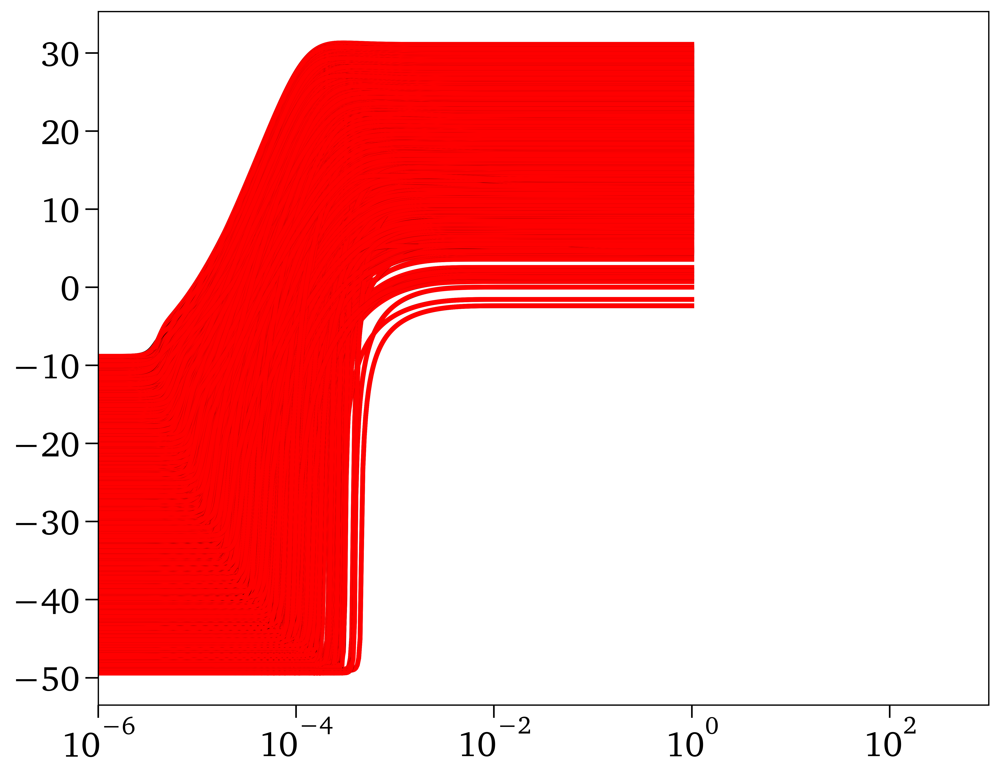

In [20]:
iVarVec = np.arange(0,yMat.shape[1])#[10, 20, 30, 40]

plt.figure(figsize=(10,8))
for iVar in iVarVec:
    plt.plot(tVec, yMat[:,iVar], '-k')
    plt.plot(tVec, yMat_[:,iVar], '-r')
plt.xscale('log')
plt.xlim([1.e-6,1.e3])

In [21]:
Vars             = ['PCA_'+str(i_mode+1) for i_mode in range(n_modesFinal)]
Data             = pd.DataFrame(yMat_pca, columns=Vars)
tVec[tVec == 0.] = FixedMinVal
Data['t']        = tVec
Data['log(t)']   = np.log(tVec)
Data['log10(t)'] = np.log10(tVec)


Data

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,...,PCA_58,PCA_59,PCA_60,PCA_61,PCA_62,PCA_63,PCA_64,t,log(t),log10(t)
0,-139.246329,11.399514,-4.139037,1.919361,-1.359787,0.855788,0.577195,-0.353856,0.330122,-0.213039,...,-0.000505,-0.000960,-0.002718,0.000829,0.000742,-0.001095,-0.001325,1.000000e-07,-16.118096,-7.000000
1,-139.246808,11.399879,-4.139351,1.919687,-1.360125,0.856101,0.577471,-0.354080,0.330360,-0.213229,...,-0.000509,-0.000990,-0.002743,0.000845,0.000752,-0.001107,-0.001372,1.032828e-07,-16.085795,-6.985972
2,-139.246824,11.399891,-4.139361,1.919698,-1.360136,0.856112,0.577480,-0.354087,0.330368,-0.213235,...,-0.000509,-0.000991,-0.002744,0.000845,0.000753,-0.001108,-0.001373,1.066734e-07,-16.053494,-6.971944
3,-139.246841,11.399904,-4.139372,1.919709,-1.360147,0.856122,0.577489,-0.354095,0.330376,-0.213242,...,-0.000510,-0.000992,-0.002745,0.000846,0.000753,-0.001108,-0.001375,1.101753e-07,-16.021193,-6.957916
4,-139.246857,11.399917,-4.139383,1.919721,-1.360159,0.856133,0.577499,-0.354103,0.330384,-0.213248,...,-0.000510,-0.000993,-0.002746,0.000846,0.000754,-0.001109,-0.001376,1.137921e-07,-15.988892,-6.943888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,90.157238,8.243059,1.797514,0.968542,0.576842,0.341673,-0.322190,-0.250951,-0.121314,-0.118225,...,-0.000485,0.008006,-0.001782,0.000034,0.004364,-0.001376,0.004300,8.787954e-01,-0.129203,-0.056112
496,90.157238,8.243059,1.797514,0.968542,0.576842,0.341673,-0.322189,-0.250951,-0.121313,-0.118225,...,-0.000485,0.008006,-0.001782,0.000034,0.004364,-0.001376,0.004300,9.076446e-01,-0.096902,-0.042084
497,90.157238,8.243059,1.797514,0.968541,0.576841,0.341672,-0.322189,-0.250951,-0.121313,-0.118225,...,-0.000485,0.008005,-0.001782,0.000034,0.004364,-0.001376,0.004300,9.374409e-01,-0.064602,-0.028056
498,90.157238,8.243058,1.797513,0.968541,0.576841,0.341672,-0.322189,-0.250950,-0.121313,-0.118224,...,-0.000485,0.008005,-0.001782,0.000034,0.004364,-0.001376,0.004300,9.682153e-01,-0.032301,-0.014028


In [22]:
from sklearn.model_selection import train_test_split

try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME)
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/')
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/train/')
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/valid/')
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/test/')
except:
    pass

In [23]:
data_id    = 'pts'

DataNoZero           = Data[Data['t'] >= FixedMinVal]
n_points             = len(DataNoZero)

idx                  = np.arange(n_points)
train_idx, valid_idx = train_test_split(idx, test_size=valid_perc/100, random_state=42)

n_valid              = len(valid_idx)
n_train              = len(train_idx)


try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/train/'+data_id+'/')
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/valid/'+data_id+'/')
except:
    pass

DataInput  = DataNoZero[['t', 'log10(t)', 'log(t)'] + Vars]
DataInput.iloc[train_idx].to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/train/'+data_id+'/Input.csv', index=False)
DataInput.iloc[valid_idx].to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/valid/'+data_id+'/Input.csv', index=False)

DataOutput = DataNoZero[['t', 'log10(t)', 'log(t)'] + Vars]
DataOutput.iloc[train_idx].to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/train/'+data_id+'/Output.csv', index=False)
DataOutput.iloc[valid_idx].to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/valid/'+data_id+'/Output.csv', index=False)

In [24]:
DataNoZero           = Data
n_points             = len(DataNoZero)

n_test               = n_points


try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/test/ext/')
except:
    pass

DataInput  = DataNoZero[['t', 'log10(t)', 'log(t)'] + Vars]
DataInput.to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/test/ext/Input.csv', index=False)

DataOutput = DataNoZero[['t', 'log10(t)', 'log(t)'] + Vars]
DataOutput.to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Trunk/test/ext/Output.csv', index=False)

In [25]:
from sklearn.model_selection import train_test_split

try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME)
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/')
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/train/')
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/valid/')
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/test/')
except:
    pass

In [26]:
DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/train/'

'/Users/sventur/WORKSPACE/ROMNet/romnet/scripts/generating_data/0DReactor/../../../../../ROMNet/Data/0DReact_Isobaric_500Cases_atol//10PC/OneByOne/PCA_1/Branch/train/'

In [27]:
data_id    = 'pts'

n_points             = len(DataIC)

idx                  = np.arange(n_points)
train_idx, valid_idx = train_test_split(idx, test_size=valid_perc/100, random_state=42)

n_valid              = len(valid_idx)
n_train              = len(train_idx)


try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/train/'+data_id+'/')
except:
    pass
try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/valid/'+data_id+'/')
except:
    pass

DataInput  = DataIC
DataInput.iloc[train_idx].to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/train/'+data_id+'/Input.csv', index=False)
DataInput.iloc[valid_idx].to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/valid/'+data_id+'/Input.csv', index=False)

DataOutput = pd.DataFrame(np.concatenate([A.T, C[...,np.newaxis], D[...,np.newaxis]], axis=1), columns=['PCA_'+str(i+1) for i in range(A.shape[0])]+['C','D'])
DataOutput.iloc[train_idx].to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/train/'+data_id+'/Output.csv', index=False)
DataOutput.iloc[valid_idx].to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/valid/'+data_id+'/Output.csv', index=False)

In [28]:
n_points             = len(DataIC)

n_test               = n_points

try:
    os.makedirs(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/test/ext/')
except:
    pass

DataInput  = DataIC
DataInput.to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/test/ext/Input.csv', index=False)

DataOutput = pd.DataFrame(np.concatenate([A.T, C[...,np.newaxis], D[...,np.newaxis]], axis=1), columns=['PCA_'+str(i+1) for i in range(A.shape[0])]+['C','D'])
DataOutput.to_csv(DataDir+'/'+str(NVarsRed)+'PC/'+str(PCAType)+'/PCA_'+PCA_NAME+'/Branch/test/ext/Output.csv', index=False)

In [29]:
# NComp = 2

# pca        = PCAA(ICs, scaling='none', n_components=NComp)
# C          = pca.X_center
# D          = pca.X_scale
# A          = pca.A[:,0:NComp].T
# L          = pca.L
# AT         = A.T
# print('[PCA] Shape of A        = ', A.shape)
# print('[PCA] ')

In [30]:
# #yMat_pca    = pca.transform(yMat, nocenter=False)
# ICs_pca   = ((ICs - C)/D).dot(AT)

# ICs_      = (ICs_pca.dot(A))*D + C
# print('[PCA] Shape of yMat_pca = ', ICs_pca.shape)
# print('[PCA]  Max % Error = ', np.max(abs((ICs - ICs_)/ICs)*100))
# print('[PCA]  Max      SE = ', np.max((ICs - ICs_)**2))
# print('[PCA] Mean % Error = ', np.mean(abs((ICs - ICs_)/ICs)*100))
# print('[PCA]          MSE = ', np.mean((ICs - ICs_)**2))

In [31]:
# A